In [1]:
import os
import glob
import joblib
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

from scipy.stats import zscore
from os.path import join as pjoin
from sklearn.decomposition import PCA
from utils import get_roi_data, save_ciftifile, conv2_labels

In [7]:
wk_dir = '/nfs/z1/userhome/GongZhengXin/NVP/NaturalObject/data/code/nodretinotopy/mfm_locwise_fullpipeline/'
corr_path = os.path.join(wk_dir, 'build/featurewise-corr')
voxel_mask_path = os.path.join(wk_dir, 'prep/voxel_masks/')

subs = [f'sub-0{i+1}' for i in list(range(9))]
bmaskname = 'subjvis'
layername = 'googlenet-conv2'
modelname = 'RFmodels'

mask_name = 'primaryvis-in-MMP'
voxel_mask_nii = nib.load(os.path.join(voxel_mask_path, f'nod-voxmask_{mask_name}.dlabel.nii'))
voxel_mask = np.squeeze(voxel_mask_nii.get_fdata())
voxel_indices = np.where(voxel_mask==1)[0]

pattern =os.path.join(corr_path, "sub-*/*.npy")
files = glob.glob(pattern)

# generate specific ROI
v1_voxels = np.array([ _ for _ in np.where(get_roi_data(None, 'V1')==1)[0] if _ in voxel_indices])

v2_voxels = np.array([ _ for _ in  np.where(get_roi_data(None, 'V2')==1)[0] if _ in voxel_indices])

v3_voxels = np.array([ _ for _ in  np.where(get_roi_data(None, 'V3')==1)[0] if _ in voxel_indices])

v4_voxels = np.array([ _ for _ in  np.where(get_roi_data(None, 'V4')==1)[0] if _ in voxel_indices])

sharing_repeats = nib.load(os.path.join(voxel_mask_path, 'nod-voxmask_gmmret-in-subj-repeats.dscalar.nii')).get_fdata()
mask_gmm = nib.load(os.path.join(voxel_mask_path, 'nod-voxmask_gmmret-in-subj.dlabel.nii')).get_fdata()
mask_fix = nib.load(os.path.join(voxel_mask_path, 'nod-voxmask_fixret-in-subj.dlabel.nii')).get_fdata()
np.unique(sharing_repeats), mask_gmm.shape

(array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]), (9, 59412))

### collect feature wise corr

In [36]:
controlcorr_path = os.path.join(wk_dir, 'build/control/featurewise-corr')
controlpattern =os.path.join(controlcorr_path, "sub-*/*.npy")
controlfiles = glob.glob(controlpattern)
ctrlcors = []
controlfiles = sorted(controlfiles)
for file in controlfiles:
    corr = np.load(file)
    ctrlcors.append(corr)
    print(file.split('/')[-1], ':', corr.shape)
ctrlcors = np.stack(ctrlcors)

print(ctrlcors.shape)

sub-01_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-02_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-03_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-04_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-05_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-06_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-07_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-08_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
sub-09_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy : (63, 59412)
(9, 63, 59412)


In [14]:
# sub = 'sub-04'
# results = np.load(os.path.join(corr_path, f'{sub}/{sub}_bm-primaryvis-in-MMP_layer-googlenet-conv2_corr.npy'))
# all_performace = np.nan*np.zeros((63, 59412))
# all_performace[:, voxel_indices] = np.array(results).transpose()
# np.save(os.path.join(corr_path, sub, f'{sub}_bm-{mask_name}_layer-{layername}_corr.npy'), all_performace)

In [4]:
parcors = []
corrs = []
files = sorted(files)
for file in files:
    corr = np.load(file)
    if 'par' in file:
        parcors.append(corr)
    else:
        corrs.append(corr)
    # print(file.split('/')[-1], ':', corr.shape)
    uniq_vox = np.unique(np.where(np.isnan(corr[:, voxel_indices])==1)[1])
    num_vox = len(np.where(np.isnan(corr[:, voxel_indices])==1)[1])
    average_nan = num_vox/(len(uniq_vox)+1e-18)
    print('# nan voxel:',num_vox, '; include', uniq_vox, '; average nan per voxel', average_nan)
corrs = np.stack(corrs)
parcors = np.stack(parcors)
print(corrs.shape, parcors.shape)

# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 63 ; include [4118] ; average nan per voxel 63.0
# nan voxel: 63 ; include [4118] ; average nan per voxel 63.0
# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 63 ; include [3986] ; average nan per voxel 63.0
# nan voxel: 63 ; include [3986] ; average nan per voxel 63.0
# nan voxel: 63 ; include [2264] ; average nan per voxel 63.0
# nan voxel: 63 ; include [2264] ; average nan per voxel 63.0
# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 0 ; include [] ; average nan per voxel 0.0
# nan voxel: 63 ; include [1713] ; average nan per voxel 63.0
# nan voxel: 63 ; include [1713] ; average nan per voxel 63.0
# nan voxel: 315 ; include [1636 2114 3807 3886 3887] ; average nan per voxel 63.0
# nan voxel: 315 ; include [1636 2114 3807 3886 3887] ; average nan per voxel 63.0
# 

num of betas in lowfreq : (27676,)
num of betas in color : (6512,)
num of betas in colorcontrast : (16280,)
num of betas in multicolor : (14652,)
num of betas in complxgabor : (14652,)
num of betas in gabor : (16280,)
num of betas in other : (4884,)
num of betas in hatch : (1628,)


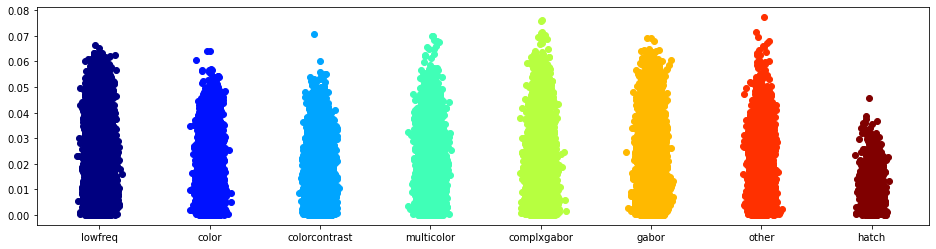

In [7]:
sub = 'sub-02'
idx = subs.index(sub)
_roi_ = v1_voxels
_labels_ = conv2_labels

# plot_data = corrs[idx, :, _roi_]
plot_data = parcors[idx, :, _roi_]
# plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v3),:], axis=1)
# plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v1),:], axis=0)

labels = list(_labels_.keys())
colors = plt.cm.jet(np.linspace(0, 1, len(labels)))
plt.figure(figsize=(16,4))
for key, value in _labels_.items():
    label_betas = plot_data[:, np.array(value)].flatten()
    label_betas = np.abs(label_betas)
    print(f'num of betas in {key} : {label_betas.shape}')
    plt.scatter(labels.index(key) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape), label_betas, color=colors[labels.index(key)])
plt.xticks(np.arange(len(labels)), labels)
# plt.ylim([-5,5])
plt.show()

### contrast plot

#### plot all the betas

sub-01 shape: (760, 63) (760, 63)


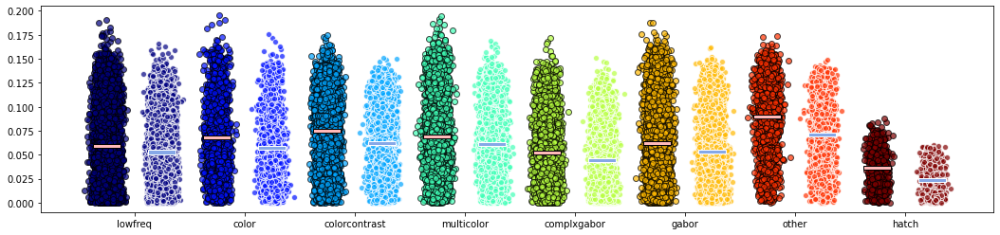

sub-02 shape: (772, 63) (772, 63)


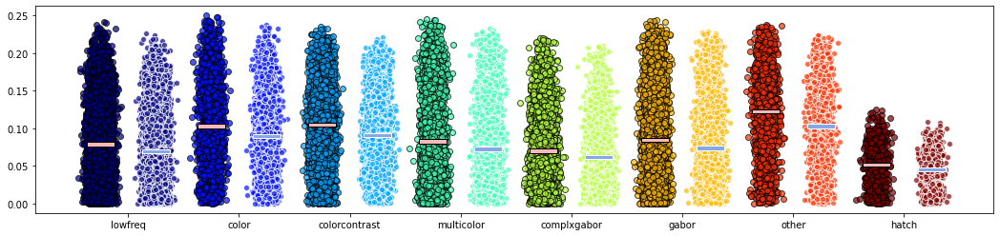

sub-03 shape: (781, 63) (781, 63)


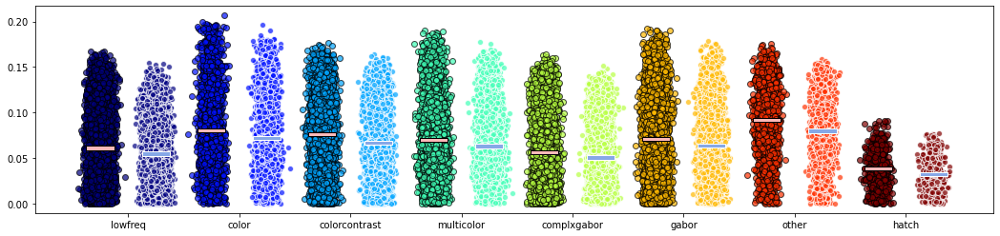

sub-04 shape: (848, 63) (848, 63)


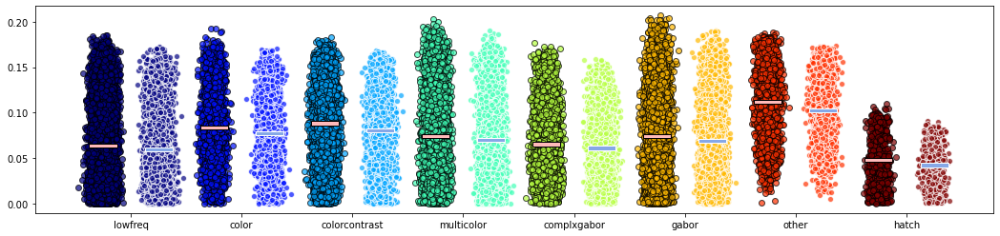

sub-05 shape: (679, 63) (679, 63)


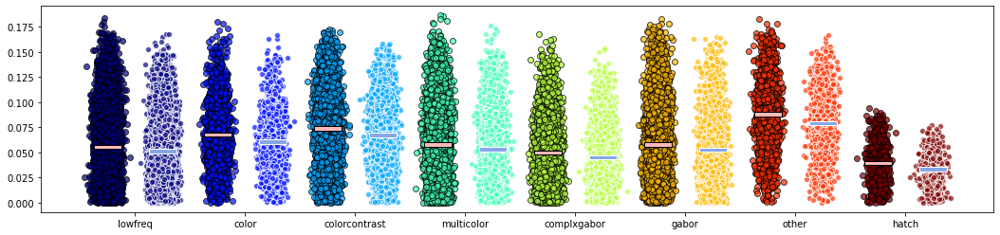

sub-06 shape: (664, 63) (664, 63)


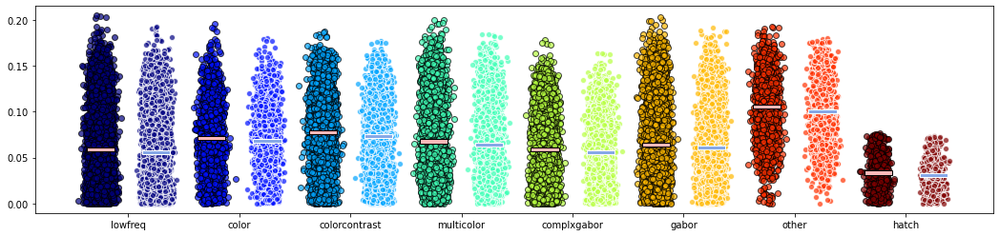

sub-07 shape: (707, 63) (707, 63)


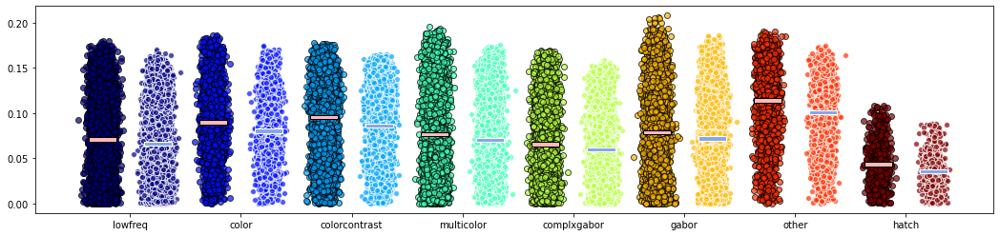

sub-08 shape: (777, 63) (777, 63)


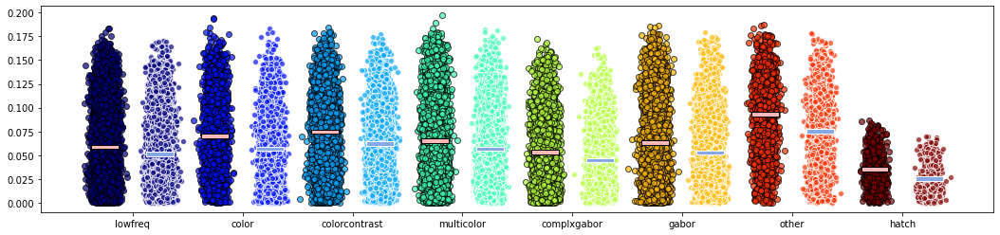

sub-09 shape: (796, 63) (796, 63)


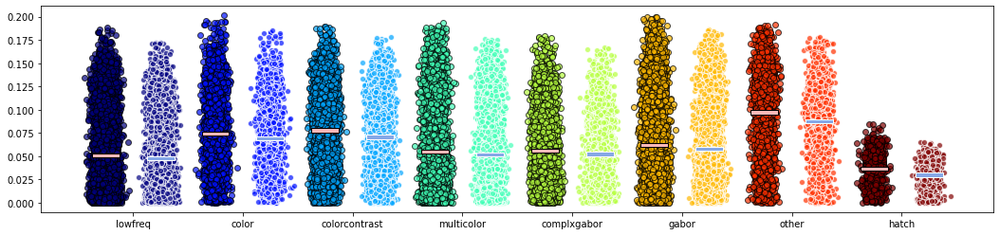

In [25]:
import matplotlib.patches as patches

for sub in subs: #[0:1]
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]]) # v1_voxels
    _labels_ = conv2_labels

    plot_data1 = corrs[idx, :, _roi_]
    plot_data2 = ctrlcors[idx, :, _roi_]
    print(sub, 'shape:', plot_data1.shape, plot_data2.shape)
    full_range = np.nanmax(plot_data1.flatten()) - np.nanmin(plot_data1.flatten()) 
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v3),:], axis=1)
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v1),:], axis=0)
    width, height = 0.25, 0.012*full_range  # 矩形的宽度和高度

    labels = list(_labels_.keys())
    colors = plt.cm.jet(np.linspace(0, 1, len(labels)))
    fig, ax = plt.subplots(figsize=(18,4))
    for key, value in _labels_.items():
        label_betas = plot_data1[:, np.array(value)].flatten()
        label_betas = np.abs(label_betas)
        # print(f'num of betas in {key} : {label_betas.shape}')
        plot_x = labels.index(key) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
        ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='black') #
        rect_x = labels.index(key) - width/2
        rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='black', facecolor="#FFB9B9")
        ax.add_patch(rect)
    for key, value in _labels_.items():
        label_betas = plot_data2[:, np.array(value)].flatten()
        label_betas = np.abs(label_betas)
        # print(f'num of betas in {key} : {label_betas.shape}')
        plot_x = (labels.index(key)+0.5) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
        ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='white') #
        rect_x = labels.index(key) + 0.5 - width/2
        rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='white', facecolor="#86A8E7")
        ax.add_patch(rect)
    # plt.ylim([-0.01, 0.252])
    plt.xticks(np.arange(len(labels))+0.25, labels)
    # plt.ylim([-5,5])
    plt.show()

num of betas in lowfreq : (249084,)
num of betas in color : (58608,)
num of betas in colorcontrast : (146520,)
num of betas in multicolor : (131868,)
num of betas in complxgabor : (131868,)
num of betas in gabor : (146520,)
num of betas in other : (43956,)
num of betas in hatch : (14652,)
num of betas in lowfreq : (249084,)
num of betas in color : (58608,)
num of betas in colorcontrast : (146520,)
num of betas in multicolor : (131868,)
num of betas in complxgabor : (131868,)
num of betas in gabor : (146520,)
num of betas in other : (43956,)
num of betas in hatch : (14652,)


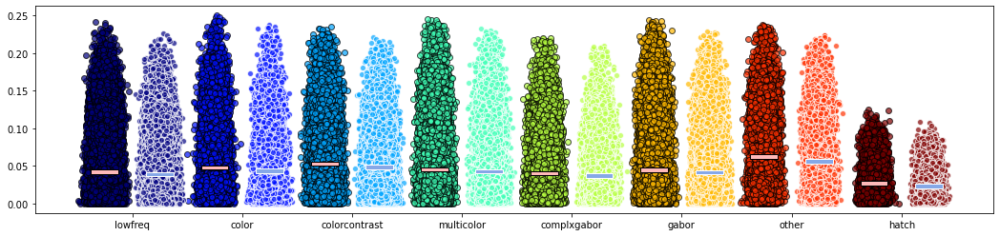

In [19]:
_roi_ = v1_voxels
_labels_ = conv2_labels

plot_data1 = corrs[:, :, _roi_].transpose((1, 0, 2)).reshape((63, -1))
plot_data2 = ctrlcors[:, :, _roi_].transpose((1, 0, 2)).reshape((63, -1))
full_range = np.nanmax(plot_data1.flatten()) - np.nanmin(plot_data1.flatten()) 
# plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v3),:], axis=1)
# plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v1),:], axis=0)
width, height = 0.25, 0.012*full_range  # 矩形的宽度和高度

labels = list(_labels_.keys())
colors = plt.cm.jet(np.linspace(0, 1, len(labels)))
fig, ax = plt.subplots(figsize=(18,4))
for key, value in _labels_.items():
    label_betas = plot_data1[np.array(value), :].flatten()
    label_betas = np.abs(label_betas)
    print(f'num of betas in {key} : {label_betas.shape}')
    plot_x = labels.index(key) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
    ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='black') #
    rect_x = labels.index(key) - width/2
    rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='black', facecolor="#FFB9B9")
    ax.add_patch(rect)
for key, value in _labels_.items():
    label_betas = plot_data2[np.array(value), :].flatten()
    label_betas = np.abs(label_betas)
    print(f'num of betas in {key} : {label_betas.shape}')
    plot_x = (labels.index(key)+0.5) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
    ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='white') #
    rect_x = labels.index(key) + 0.5 - width/2
    rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='white', facecolor="#86A8E7")
    ax.add_patch(rect)
# plt.ylim([-0.01, 0.252])
plt.xticks(np.arange(len(labels))+0.25, labels)
# plt.ylim([-5,5])
plt.show()

#### plot the max beta for each category

In [27]:
np.nanmax(plot_data1,axis=1).shape

(796,)

sub-01 shape: (760, 63) (760, 63)


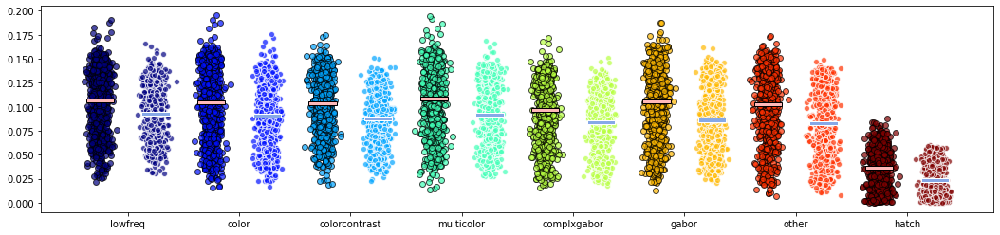

sub-02 shape: (772, 63) (772, 63)


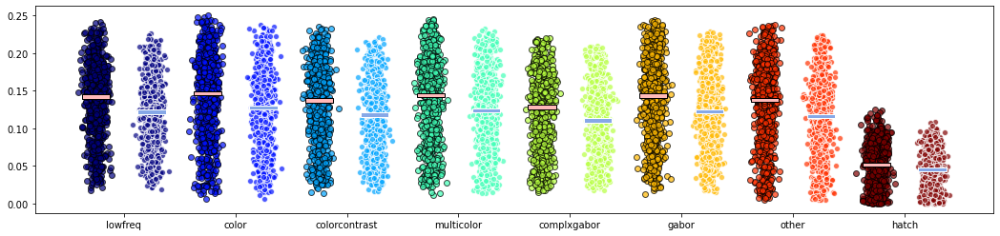

sub-03 shape: (781, 63) (781, 63)


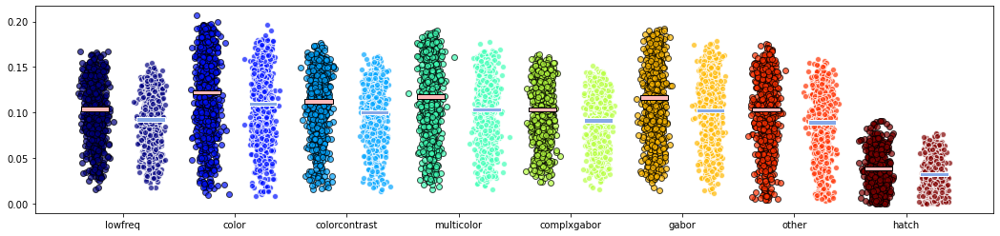

sub-04 shape: (848, 63) (848, 63)


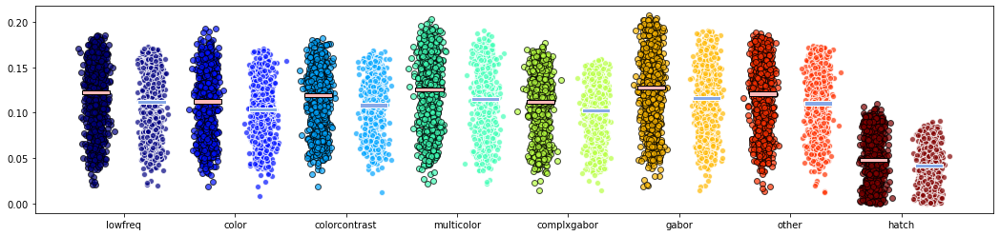

sub-05 shape: (679, 63) (679, 63)


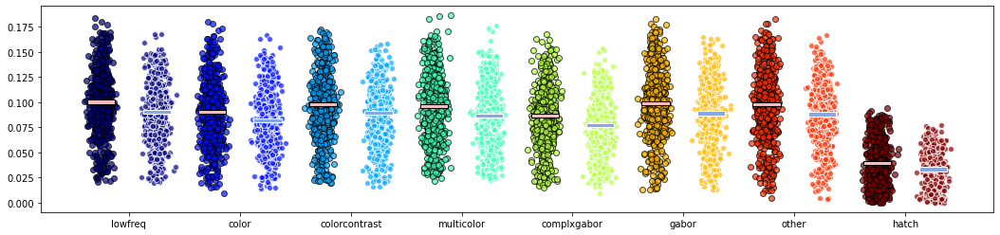

sub-06 shape: (664, 63) (664, 63)


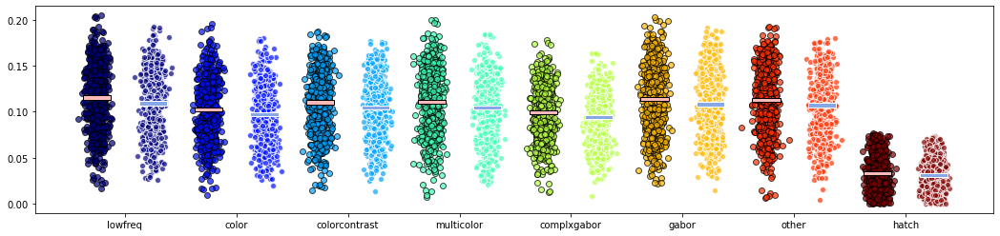

sub-07 shape: (707, 63) (707, 63)


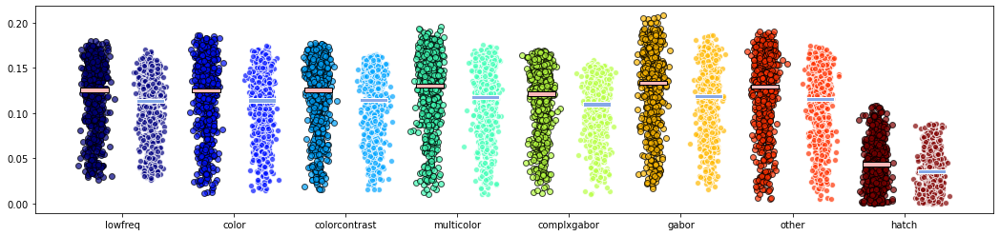

sub-08 shape: (777, 63) (777, 63)


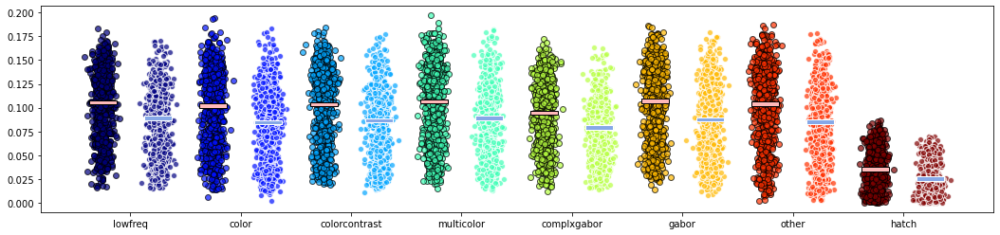

sub-09 shape: (796, 63) (796, 63)


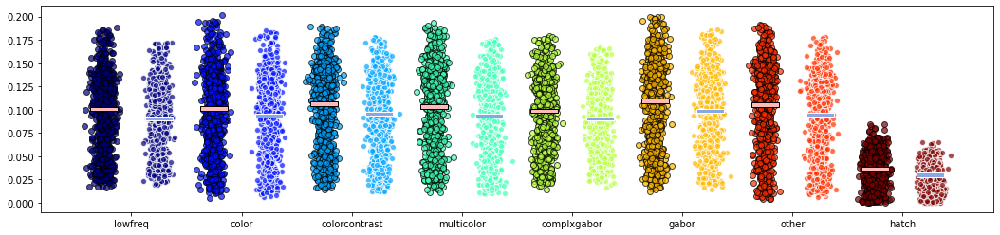

In [34]:
import matplotlib.patches as patches
sub = 'sub-01'
for sub in subs: #[0:1]
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]]) # v1_voxels #  
    _labels_ = conv2_labels

    plot_data1 = corrs[idx, :, _roi_]
    plot_data2 = ctrlcors[idx, :, _roi_]
    print(sub, 'shape:', plot_data1.shape, plot_data2.shape)
    full_range = np.nanmax(plot_data1.flatten()) - np.nanmin(plot_data1.flatten()) 
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v3),:], axis=1)
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v1),:], axis=0)
    width, height = 0.25, 0.012*full_range  # 矩形的宽度和高度

    labels = list(_labels_.keys())
    colors = plt.cm.jet(np.linspace(0, 1, len(labels)))
    fig, ax = plt.subplots(figsize=(18,4))
    for key, value in _labels_.items():
        label_betas = np.nanmax(np.abs(plot_data1[:, np.array(value)]), axis=1)
        # print(f'num of betas in {key} : {label_betas.shape}')
        plot_x = labels.index(key) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
        ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='black') #
        rect_x = labels.index(key) - width/2
        rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='black', facecolor="#FFB9B9")
        ax.add_patch(rect)
    for key, value in _labels_.items():
        label_betas = np.nanmax(np.abs(plot_data2[:, np.array(value)]), axis=1)
        label_betas = np.abs(label_betas)
        # print(f'num of betas in {key} : {label_betas.shape}')
        plot_x = (labels.index(key)+0.5) * np.ones_like(label_betas)+0.05*np.random.randn(*label_betas.shape)
        ax.scatter(plot_x, label_betas, color=colors[labels.index(key)], alpha=0.7, edgecolors='white') #
        rect_x = labels.index(key) + 0.5 - width/2
        rect = patches.Rectangle((rect_x, np.nanmean(label_betas)), width, height, edgecolor='white', facecolor="#86A8E7")
        ax.add_patch(rect)
    # plt.ylim([-0.01, 0.252])
    plt.xticks(np.arange(len(labels))+0.25, labels)
    # plt.ylim([-5,5])
    plt.show()

In [18]:
plot_data1.shape

(63, 14652)

##### plot max beta for each cate while color on different voxels

sub-01 shape: (760, 63)


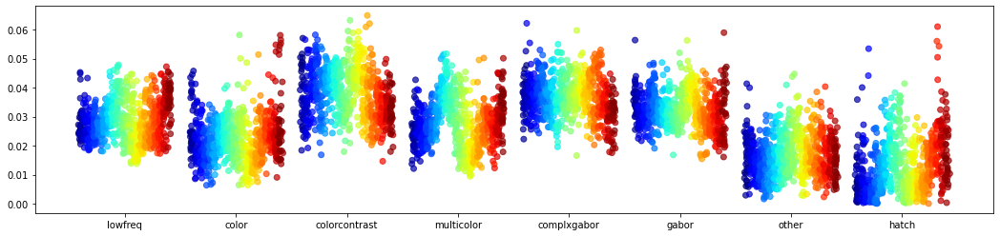

sub-02 shape: (772, 63)


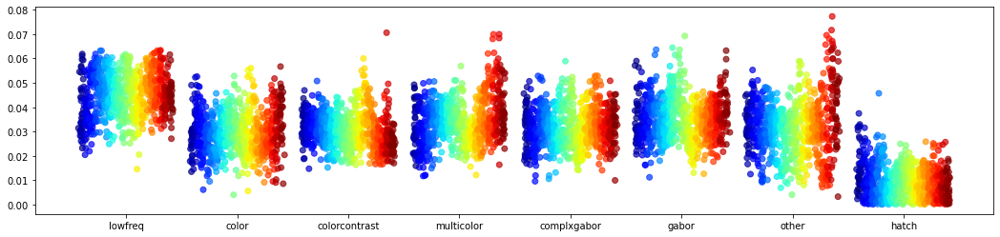

sub-03 shape: (781, 63)


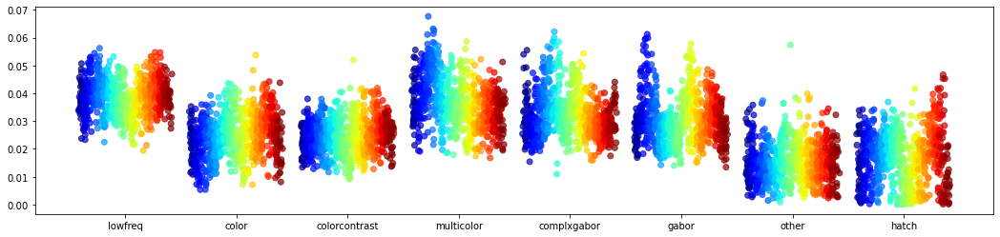

sub-04 shape: (848, 63)


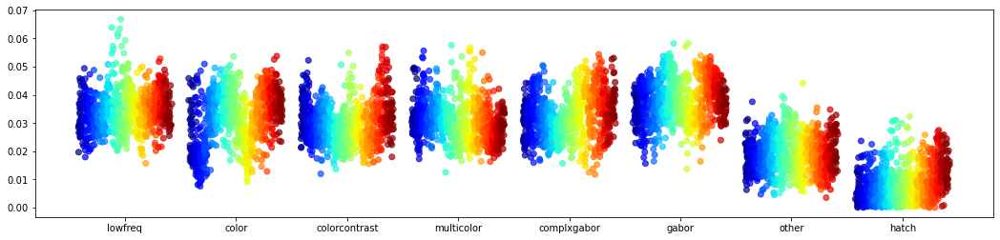

sub-05 shape: (679, 63)


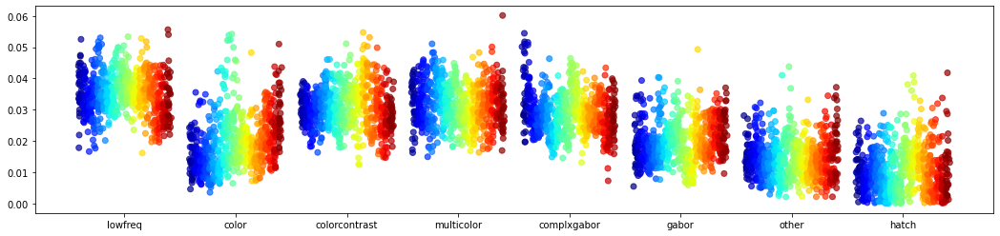

sub-06 shape: (664, 63)


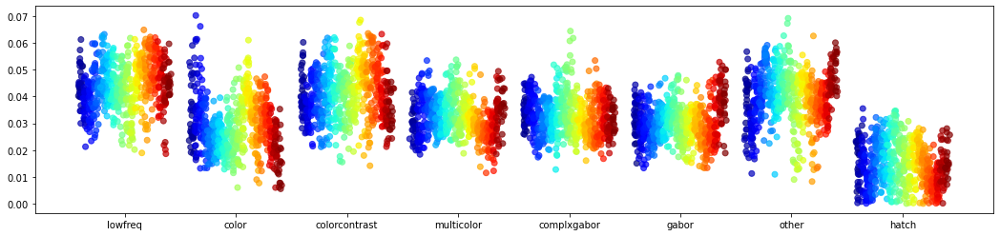

sub-07 shape: (707, 63)


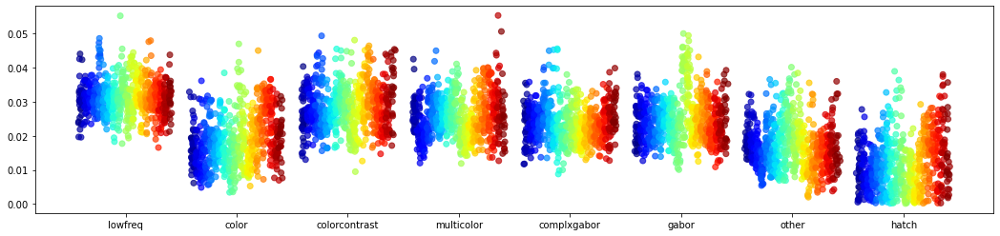

sub-08 shape: (777, 63)


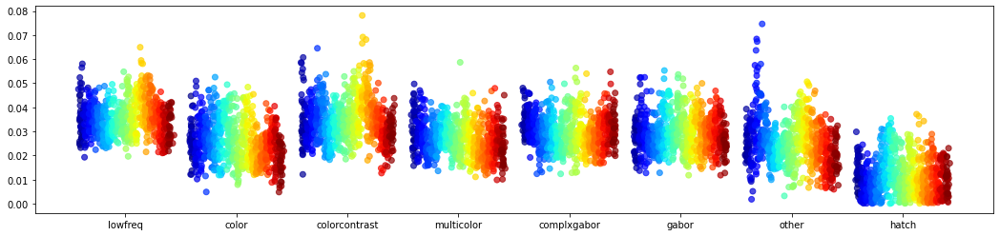

sub-09 shape: (796, 63)


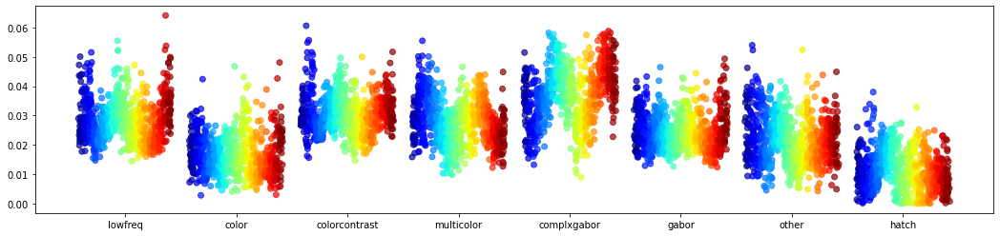

In [38]:
import matplotlib.patches as patches
import matplotlib.ticker as ticker
# 创建一个格式化器，将Y轴标签显示为小数点后一位
formatter = ticker.FormatStrFormatter("%.2f")


sub = 'sub-01'
for sub in subs: #[0:1]
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]]) # v1_voxels #  
    _labels_ = conv2_labels

    plot_data = parcors[idx, :, _roi_] # ctrlcors[idx, :, _roi_] # corrs[idx, :, _roi_] #
    print(sub, 'shape:', plot_data.shape)
    full_range = np.nanmax(plot_data.flatten()) - np.nanmin(plot_data.flatten()) 
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v3),:], axis=1)
    # plot_data = zscore(ave_model_params_inbrain[np.array(shrd_v1),:], axis=0)



    labels = list(_labels_.keys())
    colors = plt.cm.jet(np.linspace(0, 1, plot_data.shape[0]))
    n_subbin = 20
    num_in_subbin = int(np.ceil(plot_data.shape[0]/n_subbin))
    center_of_subin = np.linspace(-0.4, 0.4, n_subbin)
    cener_indices = np.arange(plot_data.shape[0]) // num_in_subbin
    centers_for_datadots = center_of_subin[cener_indices]
        
    fig, ax = plt.subplots(figsize=(18,4))
    category_betas = np.zeros((len(_labels_.keys()), plot_data.shape[0]))
    for key, value in _labels_.items():
        label_betas = np.nanmax(np.abs(plot_data[:, np.array(value)]), axis=1)
        category_betas[labels.index(key), :] = label_betas
        # print(f'num of betas in {key} : {label_betas.shape}')
        plot_x = labels.index(key) * np.ones_like(label_betas) + centers_for_datadots + 0.01*np.random.randn(*label_betas.shape)
        ax.scatter(plot_x, label_betas, color=colors, alpha=0.7) #edgecolors='black'
    # 设置Y轴的主要刻度格式化器
    ax.yaxis.set_major_formatter(formatter)

    # plt.ylim([-0.01, 0.252])
    plt.xticks(np.arange(len(labels)), labels)
    # plt.ylim([-5,5])
    plt.show()

In [40]:
mask_fix.shape, category_betas.shape

((9, 59412), (8, 796))

In [46]:
from utils import save_ciftifile
bmap_dir = os.path.join(wk_dir, 'anal/brainmap')
cmap_colors = np.zeros((len(subs), 91282))
for sub in subs: #[0:1]
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]]) 
    _labels_ = conv2_labels
    sub_category_betas = np.zeros((len(_labels_.keys()), 91282))
    
    calc_data =  corrs[idx, :, _roi_] #parcors[idx, :, _roi_] # ctrlcors[idx, :, _roi_] #
    category_betas = np.zeros((len(_labels_.keys()), calc_data.shape[0]))

    for key, value in _labels_.items():
        label_betas = np.nanmax(np.abs(calc_data[:, np.array(value)]), axis=1)
        category_betas[labels.index(key), :] = label_betas
    sub_category_betas[:, _roi_] = category_betas
    save_ciftifile( sub_category_betas, os.path.join(bmap_dir, f'{sub}_ly-conv2_category-max-betas.dtseries.nii'))
    
    cmap_colors[idx, _roi_] = np.linspace(0, 1, _roi_.shape[0])
save_ciftifile(cmap_colors, os.path.join(bmap_dir, f'sub-all_cmapcolors.dtseries.nii') )

In [51]:
retino_path = os.path.join(wk_dir, 'build/retinoparams')

layername = 'googlenet-conv2'
retino_r2 = np.zeros((len(subs), 91282))

for sub in subs: #[0:1]
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]]) 
    retino_r2[idx, 0:59412] = np.load(os.path.join(retino_path, f'{sub}_layer-{layername}_params.npy'), allow_pickle=True)[0]['R2']
save_ciftifile(retino_r2, os.path.join(bmap_dir, f'sub-all_annretinor2.dtseries.nii') )

sub-01


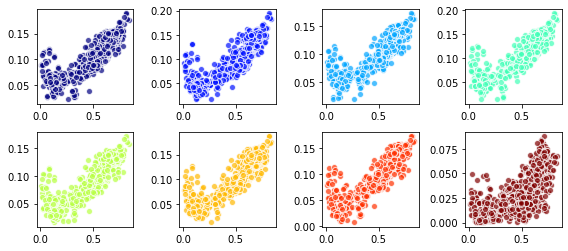

sub-02


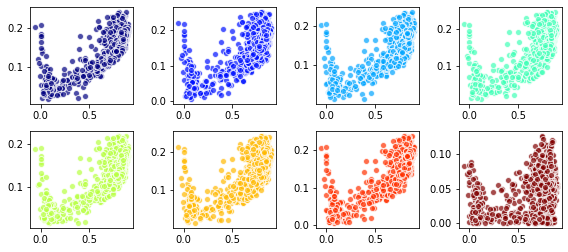

sub-03


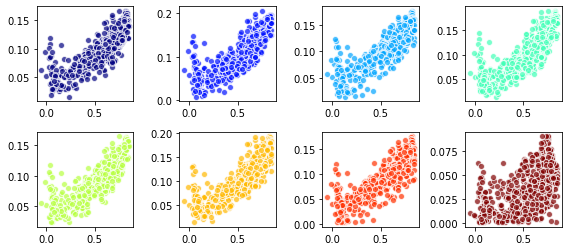

sub-04


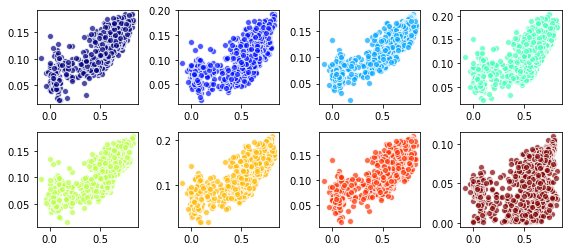

sub-05


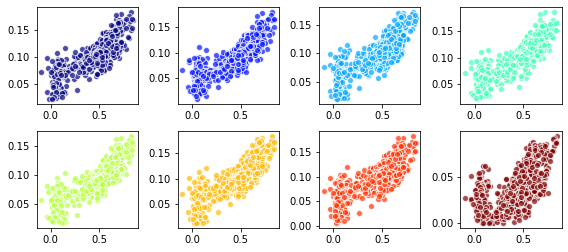

sub-06


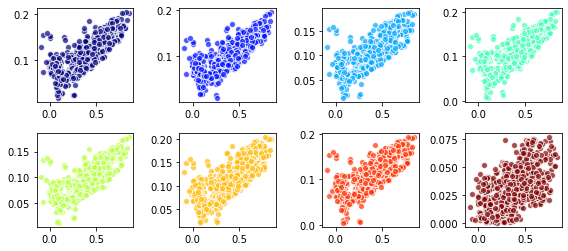

sub-07


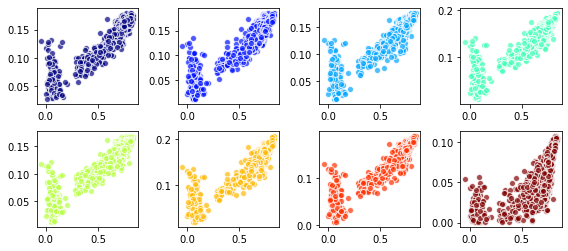

sub-08


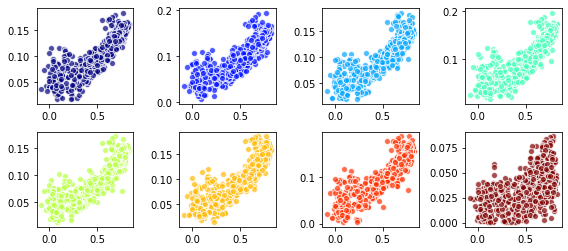

sub-09


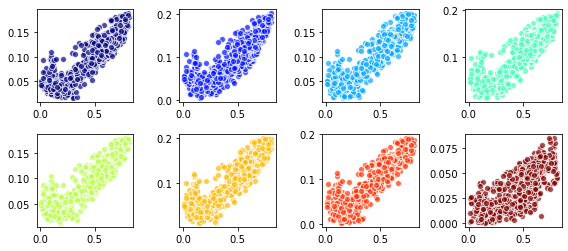

In [67]:
label_dict = conv2_labels
colors = plt.cm.jet(np.linspace(0, 1, len(label_dict.keys())))
for sub in subs: #
    idx = subs.index(sub)
    _roi_ =  np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[idx, :]==1)[0]])
    print(sub)
    fig, ax = plt.subplots(2,4,figsize=(8,3.6))
    ax = ax.flatten()
    calc_data =  corrs[idx, :, _roi_] #parcors[idx, :, _roi_] # ctrlcors[idx, :, _roi_] #
    category_betas = np.zeros((len(_labels_.keys()), calc_data.shape[0]))
    for i_feature, (key, value) in enumerate(_labels_.items()):
        label_betas = np.nanmax(np.abs(calc_data[:, np.array(value)]), axis=1)
        category_betas[labels.index(key), :] = label_betas
        
        ax[i_feature].scatter(retino_r2[idx, _roi_], label_betas, color=colors[i_feature], alpha=0.7, edgecolors='white')
        # plt.axis('equal')
    plt.tight_layout()
    plt.show()

In [52]:
retino_r2.shape

(9, 91282)

In [18]:
print(np.argsort(category_betas[0,:])[-10::], np.argsort(category_betas[0,:])[0:10])
print(np.argsort(category_betas[1,:])[-10::], np.argsort(category_betas[1,:])[0:10])
print(np.argsort(category_betas[2,:])[-10::], np.argsort(category_betas[2,:])[0:10])
print(np.argsort(category_betas[3,:])[-10::], np.argsort(category_betas[3,:])[0:10])

[618 597 640 685 662 616 638 661 617 639] [692 727 658 637 720 691 659 728 693 721]
[660 597 685 640 662 616 638 661 617 639] [692 691 658 690 732 744 525 747  25 382]
[310 284 685 662 640 616 638 661 617 639] [659 692 691 658 637 727 732 636 690  73]
[304 597 640 685 662 616 638 661 617 639] [692 691 727 728 720 658 690 689 732 756]


lowfreq 17 [1, 13, 27, 47, 56, 60, 23, 49, 0, 43, 28, 29, 34, 8, 37, 19, 15]
color 4 [2, 48, 36, 46]
colorcontrast 10 [5, 9, 10, 12, 20, 21, 42, 45, 50, 53]
multicolor 9 [3, 33, 35, 40, 17, 16, 57, 26, 31]
complxgabor 9 [51, 58, 30, 25, 52, 54, 22, 61, 55]
gabor 10 [4, 6, 32, 38, 41, 7, 11, 18, 24, 39]
other 3 [44, 62, 59]
hatch 1 [14]


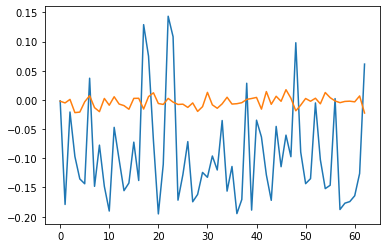

In [22]:
sort_idx = []
for k, v in conv2_labels.items():
    print(k, len(v), v)
    sort_idx.extend(v)

plt.plot(plot_data[639, np.array(sort_idx)])
plt.plot(plot_data[692, np.array(sort_idx)])
plt.show()

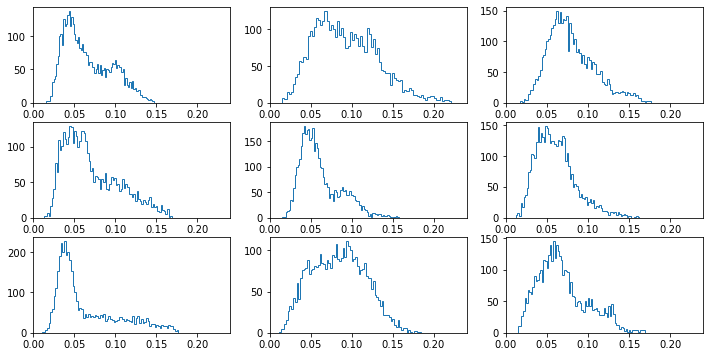

In [127]:
idx = 0
fig, axes = plt.subplots(3, 3, figsize=(12, 6))

for idx, ax in enumerate(axes.flatten()):
    sub = subs[idx]
    corr = corrs[idx, :, voxel_indices]
    max_corr = np.max(corr, axis=1)
    ax.hist(max_corr, bins=80, histtype='step')
    ax.set_xlim([0, 0.24])
plt.show()

<ipython-input-138-9e5e56f69a98>:2: RuntimeWarning: All-NaN slice encountered
  max_corr = np.nanmax(concate_corrs, axis=0)


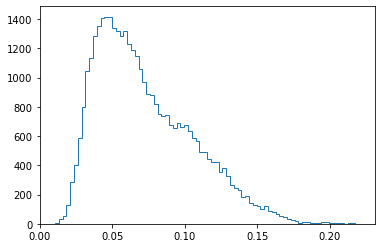

In [138]:
concate_corrs = corrs[:,:,voxel_indices].transpose((1,0,2)).reshape((63, -1))
max_corr = np.nanmax(concate_corrs, axis=0)
plt.hist(max_corr, bins=80, histtype='step')
plt.show()

### eight indices visualization

#### show the raw performance

In [9]:
sub = 'sub-03'
cate_label_names = list(conv2_labels.keys())
show_roi = np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[subs.index(sub), :]==1)[0]])
print('vertices number: ', show_roi.shape)
uv  = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_uv.npy'))[:, show_roi]
model_ev = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_model-ctg-ev.npy'))[:, show_roi]
full_ev = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_full-model-ev.npy'))[:, show_roi]
other_ev = full_ev - uv

# brainmap = np.nan * np.zeros((1, 91282))
# brainmap[:, 0:59412] = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_full-model-ev.npy'))
# save_ciftifile(brainmap, f'{wk_dir}/anal/brainmap/{sub}_ly-{layername}_full-model-ev.dtseries.nii')

vertices number:  (781,)


In [10]:
for icate, catename in enumerate(cate_label_names):
    print('#full+other+:', len(set(np.where(full_ev[0] > 0)[0]) & set(np.where(other_ev[icate] > 0)[0])), end='  ')
    print('#full+:', np.where(full_ev[0] > 0)[0].shape)
    print('full+other-:', set(np.where(full_ev[0] > 0)[0]) & set(np.where(other_ev[icate] < 0)[0]))
    print(f'<<<==={catename}')
# len(set(np.where(full_ev[0] > 0)[0]) & set(np.where(other_ev[0] > 0)[0])), np.where(full_ev[0] > 0)[0].shape


#full+other+: 612  #full+: (615,)
full+other-: {156, 612, 181}
<<<===lowfreq
#full+other+: 609  #full+: (615,)
full+other-: {736, 17, 180, 181, 185, 186}
<<<===color
#full+other+: 599  #full+: (615,)
full+other-: {450, 612, 548, 472, 744, 297, 364, 493, 181, 438, 568, 185, 186, 381, 382, 767}
<<<===colorcontrast
#full+other+: 611  #full+: (615,)
full+other-: {50, 236, 340, 767}
<<<===multicolor
#full+other+: 605  #full+: (615,)
full+other-: {386, 548, 518, 396, 493, 50, 568, 537, 156, 511}
<<<===complxgabor
#full+other+: 606  #full+: (615,)
full+other-: {386, 612, 485, 715, 493, 46, 50, 377, 767}
<<<===gabor
#full+other+: 610  #full+: (615,)
full+other-: {545, 485, 744, 715, 493}
<<<===other
#full+other+: 610  #full+: (615,)
full+other-: {707, 708, 485, 715, 342}
<<<===hatch


##### all feature ev in single plot

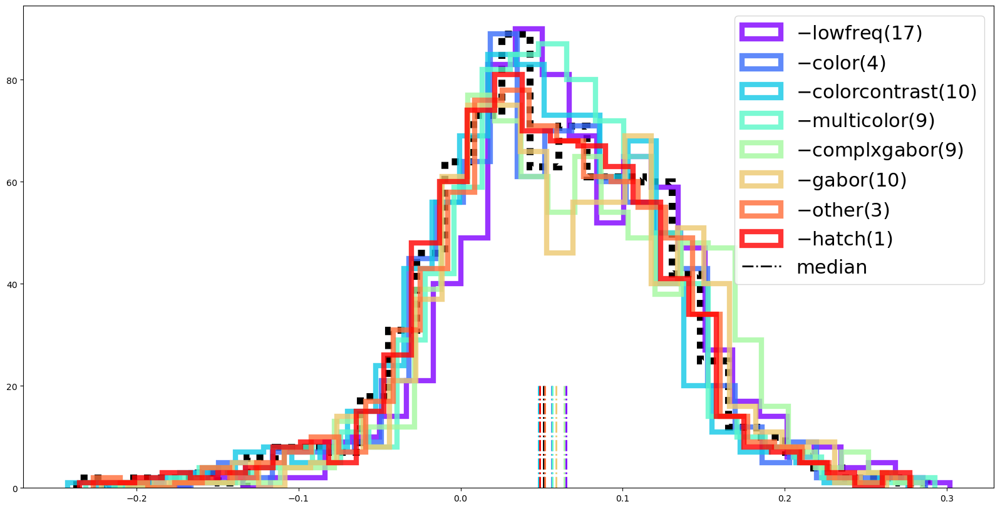

In [13]:
colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))
num_bin = 30
plt.style.use('default')
fig, ax = plt.subplots(figsize=(20, 10))
ax.hist(full_ev[0], histtype='step', bins=num_bin,color='k', lw=8, ls=(0, (1, 1, 1, 1, 1, 1)))#,zorder=3
ax.vlines(x=np.median(full_ev[0]), ymin=0, ymax=20, color='k', ls='-.', label='median', lw=2)
for icate in range(len(cate_label_names)):
    labelname = cate_label_names[icate] + f'({len(conv2_labels[cate_label_names[icate]])})'
    ax.hist(other_ev[icate], bins=num_bin, histtype='step', lw=6, ls='-', alpha=0.8, color=colors[icate], label=f'$-${labelname}')
    ax.vlines(x=np.median(other_ev[icate]), ymin=0, ymax=20, color=colors[icate], ls='-.', lw=2)

ax.legend(fontsize=22)
plt.show()

##### all feature ev in separate plots & backgrounded by full model ev

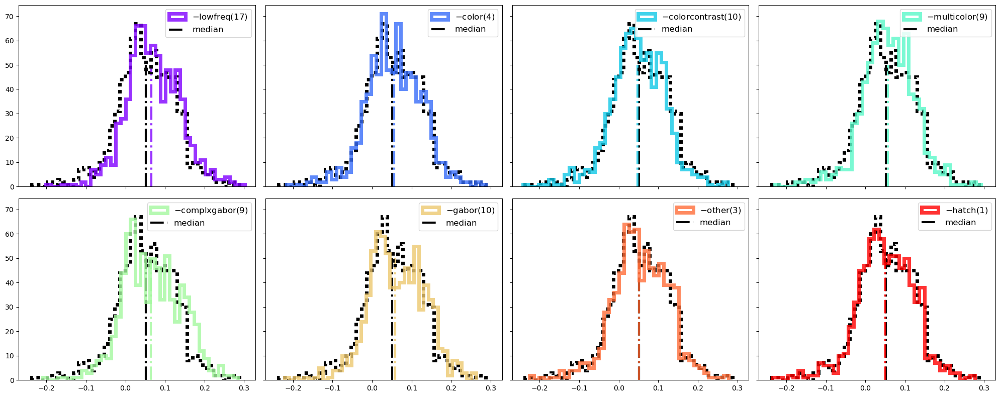

In [14]:
cate_label_names = list(conv2_labels.keys())
colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))
num_bin = 40
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharey=True, sharex=True)
x_data, y_data = full_ev[0], other_ev

for idx, ax in enumerate(axes.flatten()):
    ax.hist(x_data, histtype='step', bins=num_bin,color='k', lw=5, ls=(0, (1, 1, 1, 1, 1, 1)))#,zorder=3
    ax.vlines(x=np.median(x_data), ymin=0, ymax=50, color='k', ls='-.', label='median', lw=3)
    labelname = r'$-$' + cate_label_names[idx] + f'({len(conv2_labels[cate_label_names[idx]])})'
    ax.hist(y_data[idx], bins=num_bin, histtype='step', lw=5, ls='-', alpha=0.8, color=colors[idx], label=labelname)
    ax.vlines(x=np.median(y_data[idx]), ymin=0, ymax=50, color=colors[idx], ls='-.', lw=3, alpha=0.8)
    ax.legend(fontsize=12)
plt.tight_layout()
plt.show()

##### scatter plot - full model contrast other model

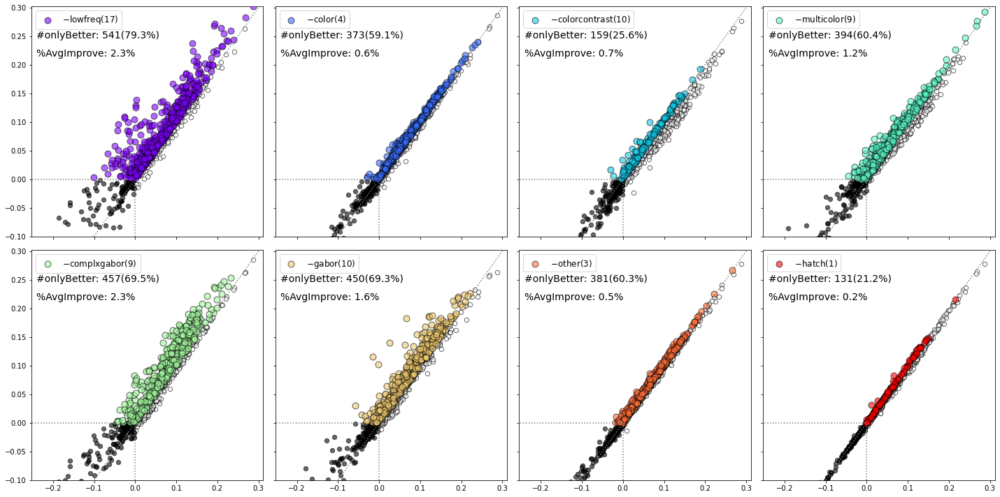

In [300]:
cate_label_names = list(conv2_labels.keys())
colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))

fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharey=True, sharex=True)


# x_data, y_data = full_ev[0][np.where(full_ev[0] > 0)[0]], other_ev[:, np.where(full_ev[0] > 0)[0]]
x_data, y_data = full_ev[0], other_ev
lim = [np.minimum(np.min(x_data), np.min(y_data))-0.01, np.maximum(np.max(x_data), np.max(y_data))+0.01]

for idx, ax in enumerate(axes.flatten()):
    # #
    # x_data = x_data[np.where(y_data[idx] > 0)[0]]
    # y_data = y_data[:, np.where(y_data[idx] > 0)[0]]
    
    #
    dark_voxels = np.where(((x_data < 0) & (y_data[idx]<0))==True)[0]
    saiyan_voxels = np.array([_ for _ in np.where((x_data < y_data[idx])==1)[0] if _ not in dark_voxels])
    usual_voxels = np.array([_ for _ in np.where((x_data < y_data[idx])==0)[0] if _ not in dark_voxels])
    labelname = r'$-$' + cate_label_names[idx] + f'({len(conv2_labels[cate_label_names[idx]])})'
    ax.scatter(x_data[saiyan_voxels], y_data[idx][saiyan_voxels], color=colors[idx], label=labelname, alpha=0.6, edgecolors='k', s=80, zorder=4)
    ax.scatter(x_data[usual_voxels], y_data[idx][usual_voxels], color='white', alpha=0.6, edgecolors='k', s=40)
    ax.scatter(x_data[dark_voxels], y_data[idx][dark_voxels], color='black', alpha=0.6, edgecolors='k', s=40)

    ax.plot([-0.25, 0.32], [-0.25, 0.32], color='gray',ls='dotted', zorder=3)
    ax.hlines(y=0, xmin=-0.25, xmax=0, color='gray',ls='dotted', zorder=5)
    ax.vlines(x=0, ymin=-0.25, ymax=0, color='gray',ls='dotted', zorder=5)

    ax.set_xlim(lim)
    ax.set_ylim(lim)

    ax.set_ylim([-0.1, np.maximum(np.max(x_data), np.max(y_data))])
    ax.legend(fontsize=12)
    infotext1 = f'#onlyBetter: {len(saiyan_voxels)}({round(1000*len(saiyan_voxels)/(len(x_data)-len(dark_voxels)))/10}%)'
    infotext2 = f'%AvgImprove: {round(1000*np.mean((y_data[idx][saiyan_voxels] - x_data[saiyan_voxels])))/10}%'
    ax.text(lim[0]*0.95, lim[1]*0.79, infotext1, fontsize=14, zorder=7)
    ax.text(lim[0]*0.95, lim[1]*0.69, infotext2, fontsize=14, zorder=7)

    # 
    # x_data, y_data = full_ev[0], model_ev
    
plt.tight_layout()
plt.show()


##### full model contrast feature category model

(781,) (8, 781)


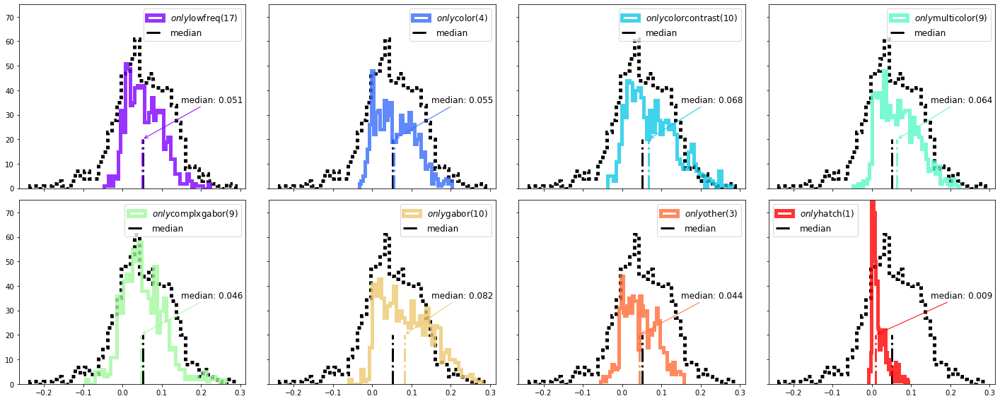

In [253]:
num_bin = 45
fig, axes = plt.subplots(2, 4, figsize=(20, 8), sharey=True, sharex=True)
x_data, y_data = full_ev[0], model_ev
print(x_data.shape, y_data.shape)
for idx, ax in enumerate(axes.flatten()):
    ax.hist(x_data, histtype='step', bins=num_bin,color='k', lw=5, ls=(0, (1, 1, 1, 1, 1, 1)))#,zorder=3
    ax.vlines(x=np.median(x_data), ymin=0, ymax=20, color='k', ls='-.', label='median', lw=3)
    
    labelname = r'$only$' + cate_label_names[idx] + f'({len(conv2_labels[cate_label_names[idx]])})'

    ax.hist(y_data[idx], bins=num_bin, histtype='step', lw=5, ls='-', alpha=0.8, color=colors[idx], label=labelname)
    ax.vlines(x=np.median(y_data[idx]), ymin=0, ymax=20, color=colors[idx], ls='-.', lw=3, alpha=0.8)
    # 使用annotate函数添加注释
    annotation_text = f'median: {round(1000*np.median(y_data[idx]))/1000}'
    ax.annotate(annotation_text, xy=(np.median(y_data[idx]), 20), xytext=(0.15, 20 + 15),
            arrowprops=dict(arrowstyle='->', color=colors[idx]), fontsize=12)

    ax.legend(fontsize=12)
    ax.set_ylim([0, 75])
plt.tight_layout()
plt.show()

==<<sub-01
vertices number:  (760,)


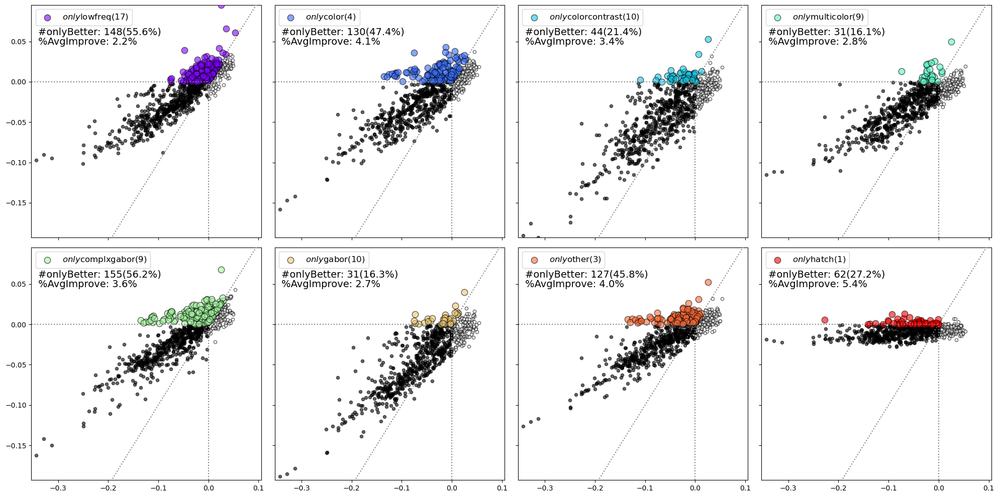

==<<sub-02
vertices number:  (772,)


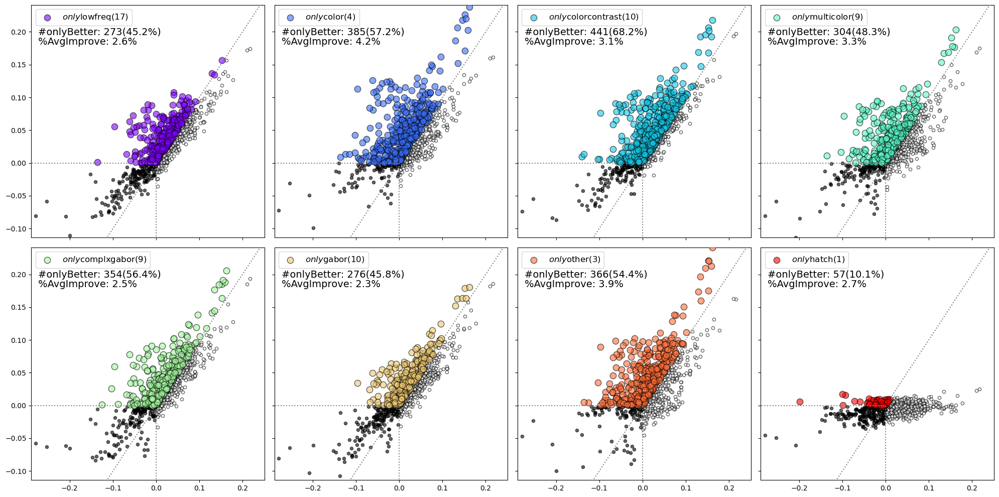

==<<sub-03
vertices number:  (781,)


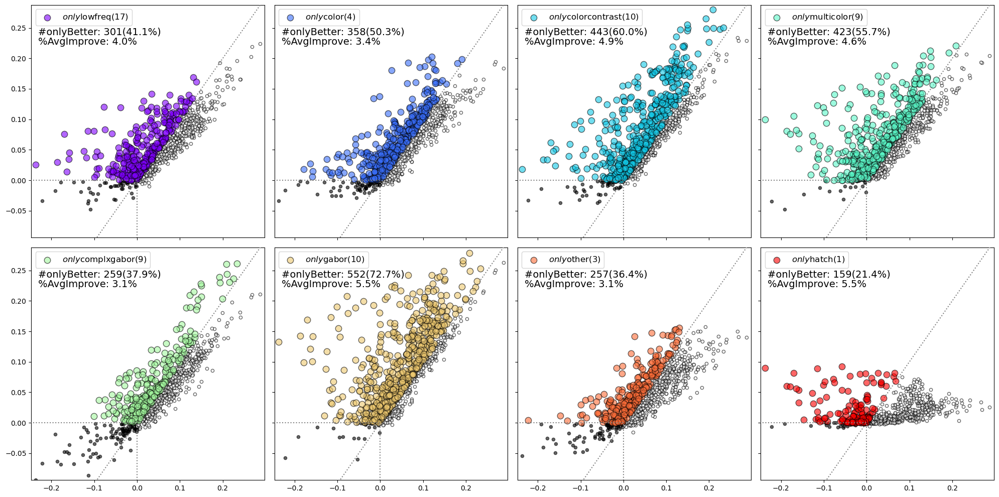

==<<sub-04
vertices number:  (848,)


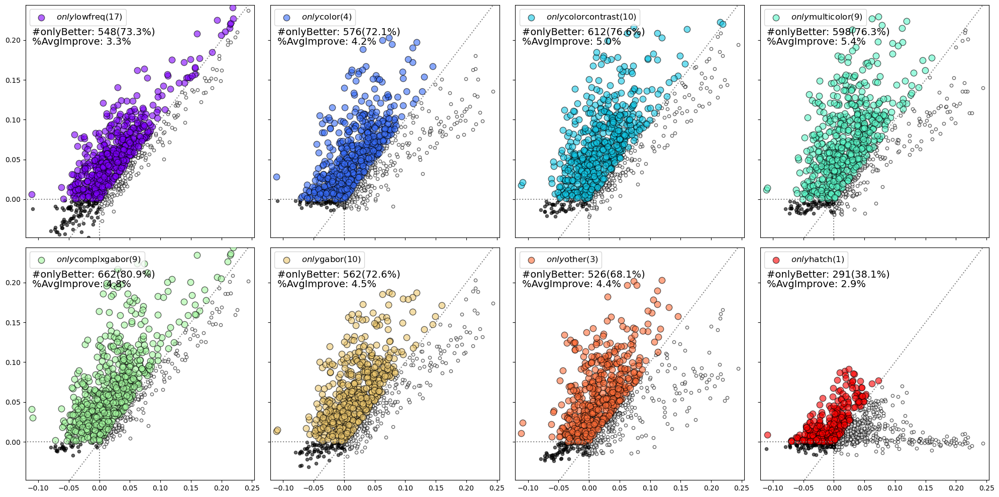

==<<sub-05
vertices number:  (679,)


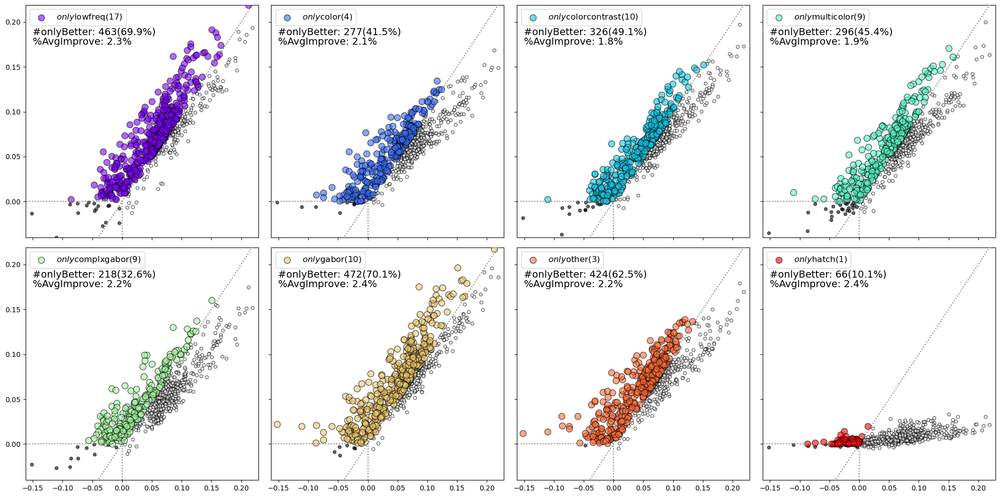

==<<sub-06
vertices number:  (664,)


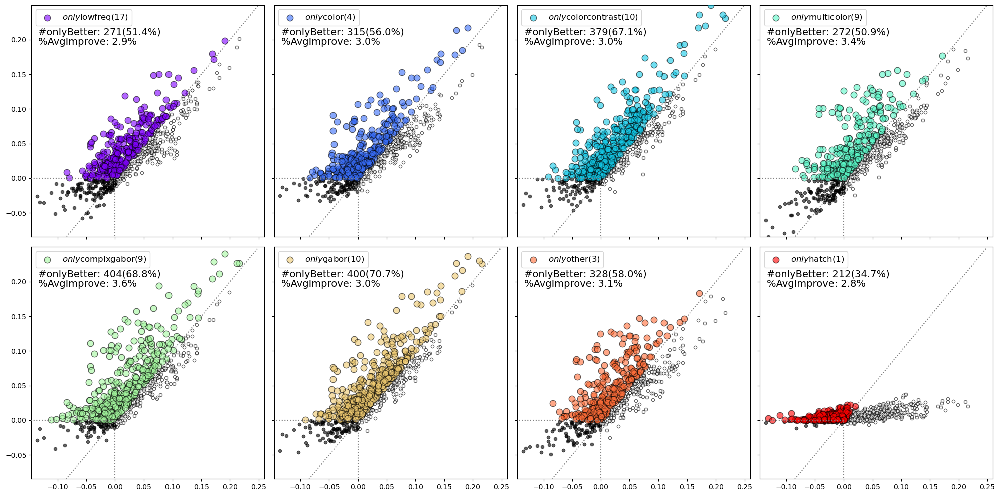

==<<sub-07
vertices number:  (707,)


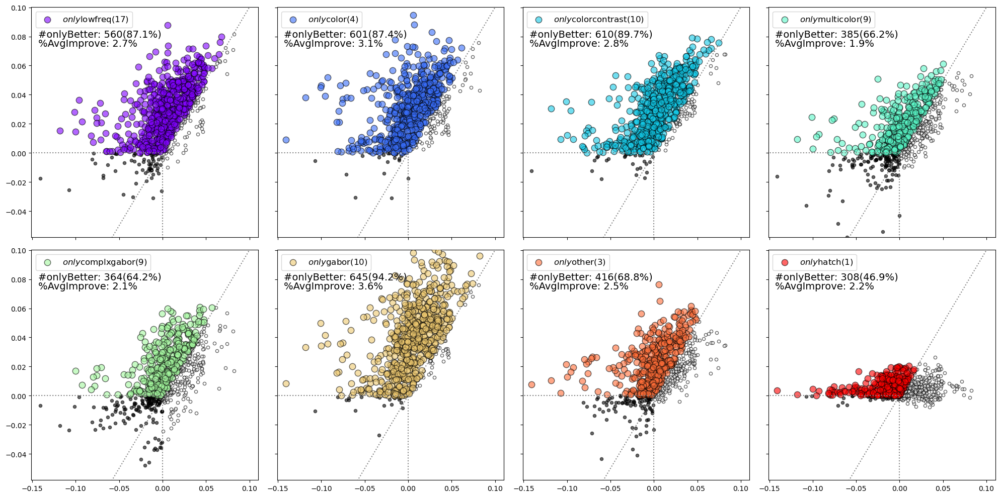

==<<sub-08
vertices number:  (777,)


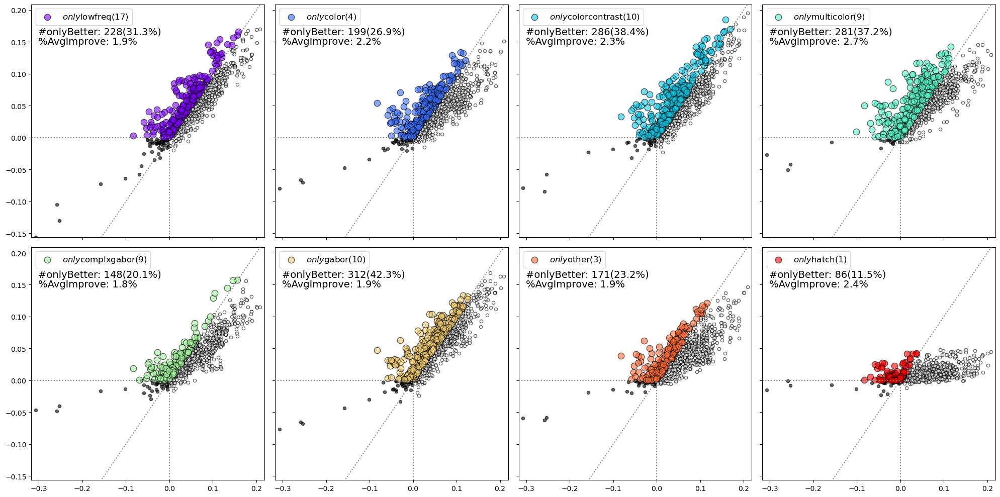

==<<sub-09
vertices number:  (796,)


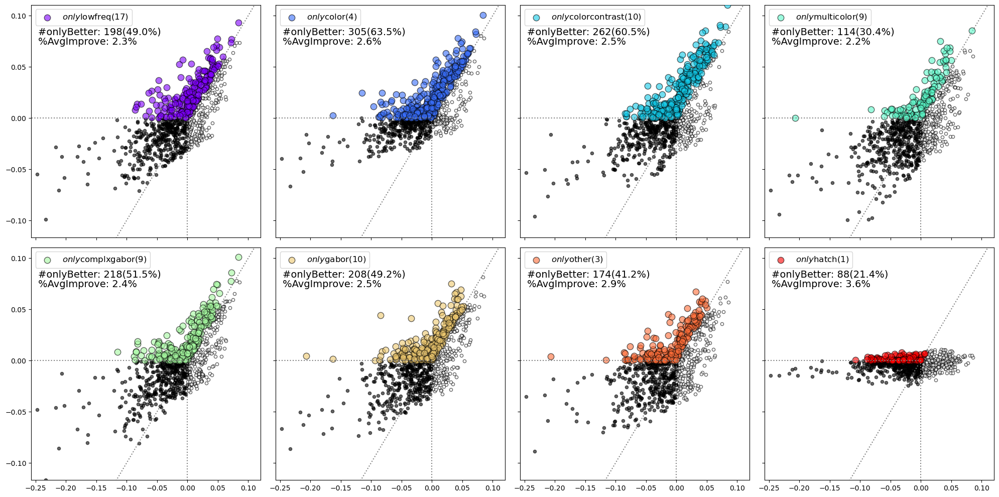

In [25]:
sub = 'sub-03'
cate_label_names = list(conv2_labels.keys())
for sub in subs: #[0:1]
    print(f'==<<{sub}')
    show_roi = np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[subs.index(sub), :]==1)[0]])
    print('vertices number: ', show_roi.shape)
    uv  = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_uv.npy'))[:, show_roi]
    model_ev = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_model-ctg-ev.npy'))[:, show_roi]
    full_ev = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_full-model-ev.npy'))[:, show_roi]

    fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharey=True, sharex=True)

    # x_data, y_data = full_ev[0][np.where(full_ev[0] > 0)[0]], model_ev[:, np.where(full_ev[0] > 0)[0]]
    x_data, y_data = full_ev[0], model_ev
    lim = [np.minimum(np.min(x_data), np.min(y_data))-0.01, np.maximum(np.max(x_data), np.max(y_data))+0.01]

    for idx, ax in enumerate(axes.flatten()):
        # #
        # x_data = x_data[np.where(y_data[idx] > 0)[0]]
        # y_data = y_data[:, np.where(y_data[idx] > 0)[0]]
        
        #
        dark_voxels = np.where(((x_data < 0) & (y_data[idx]<0))==True)[0]
        saiyan_voxels = np.array([_ for _ in np.where((x_data < y_data[idx])==1)[0] if _ not in dark_voxels])
        usual_voxels = np.array([_ for _ in np.where((x_data < y_data[idx])==0)[0] if _ not in dark_voxels])
        labelname = r'$only$' + cate_label_names[idx] + f'({len(conv2_labels[cate_label_names[idx]])})'
        ax.scatter(x_data[saiyan_voxels], y_data[idx][saiyan_voxels], color=colors[idx], label=labelname, alpha=0.6, edgecolors='k', s=80, zorder=4)
        ax.scatter(x_data[usual_voxels], y_data[idx][usual_voxels], color='white', alpha=0.6, edgecolors='k', s=20)
        ax.scatter(x_data[dark_voxels], y_data[idx][dark_voxels], color='black', alpha=0.6, edgecolors='k', s=20)

        ax.plot([-0.25, 0.32], [-0.25, 0.32], color='gray',ls='dotted', zorder=3)
        ax.hlines(y=0, xmin=-1, xmax=0, color='gray',ls='dotted', zorder=5)
        ax.vlines(x=0, ymin=-1, ymax=0, color='gray',ls='dotted', zorder=5)

        ax.set_xlim(lim)
        # ax.set_ylim(lim)

        ax.set_ylim([np.min(y_data), np.maximum(np.max(x_data), np.max(y_data))])
        ax.legend(fontsize=12, loc='upper left')
        infotext1 = f'#onlyBetter: {len(saiyan_voxels)}({round(1000*len(saiyan_voxels)/(len(x_data)-len(dark_voxels)))/10}%)'
        infotext2 = f'%AvgImprove: {round(1000*np.mean((y_data[idx][saiyan_voxels] - x_data[saiyan_voxels])))/10}%'
        ax.text(0.03, 0.87, infotext1, transform=ax.transAxes, fontsize=14, zorder=7)
        ax.text(0.03, 0.83, infotext2, transform=ax.transAxes, fontsize=14, zorder=7)
        
    plt.tight_layout()
    plt.show()

In [ ]:
# 


### unsorted figures

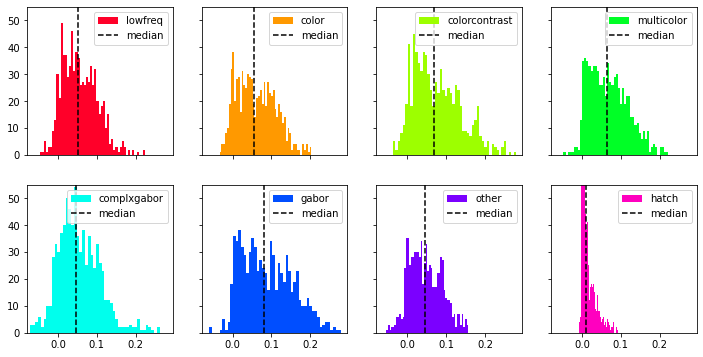

In [82]:
fig, axes = plt.subplots(2, 4, figsize=(12, 6), sharey=True, sharex=True)
cate_label_names = list(conv2_labels.keys())
colors = plt.cm.gist_rainbow(np.linspace(0, 1, len(cate_label_names)))
for idx, ax in enumerate(axes.flatten()):
    corr = model_ev[idx]
    ax.hist(corr, bins=50, color=colors[idx], label=cate_label_names[idx]) #, histtype='step'
    ax.vlines(x=np.median(corr),ymin=0,ymax=100, colors='k', linestyles='dashed',label='median')
    # ax.vlines(x=np.mean(corr),ymin=0,ymax=100, colors='white', linestyles='dashed',label='mean')
    ax.set_ylim([0, 55])
    ax.set_xlim([-0.08, 0.295])
    ax.legend()
plt.show()

(array([  3.,  10.,  19.,  53.,  66., 101., 194., 213.,  95.,  27.]),
 array([-0.15836449, -0.13495356, -0.11154263, -0.08813171, -0.06472078,
        -0.04130985, -0.01789892,  0.005512  ,  0.02892293,  0.05233386,
         0.07574478]),
 <BarContainer object of 10 artists>)

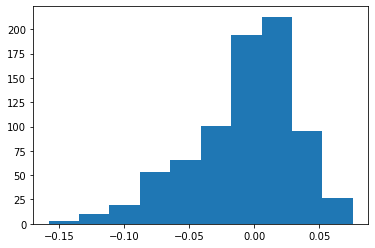

In [42]:
full_ev = np.load(pjoin(corr_path,f'shuffle/sub-03/sub-03_bm-primaryvis-in-MMP_layer-googlenet-conv2_full-model-ev.npy'))[:, show_roi]
plt.hist(full_ev[0])

In [29]:
uv  = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_uv-train.npy'))[:, show_roi]
model_ev = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_model-ctg-ev-train.npy'))[:, show_roi]
uv.mean(axis=1)

array([0.00573064, 0.0009954 , 0.00162764, 0.00313009, 0.00267018,
       0.00242228, 0.00042742, 0.00029298])

sub-01


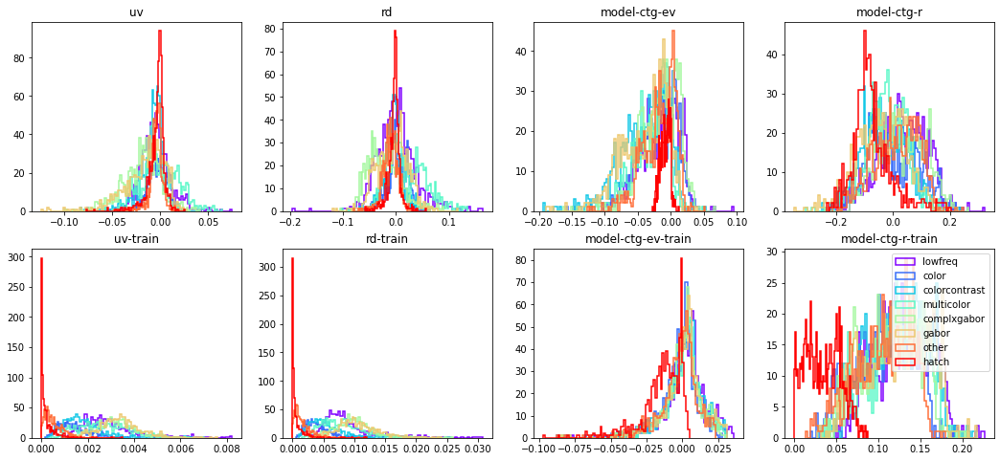

sub-05


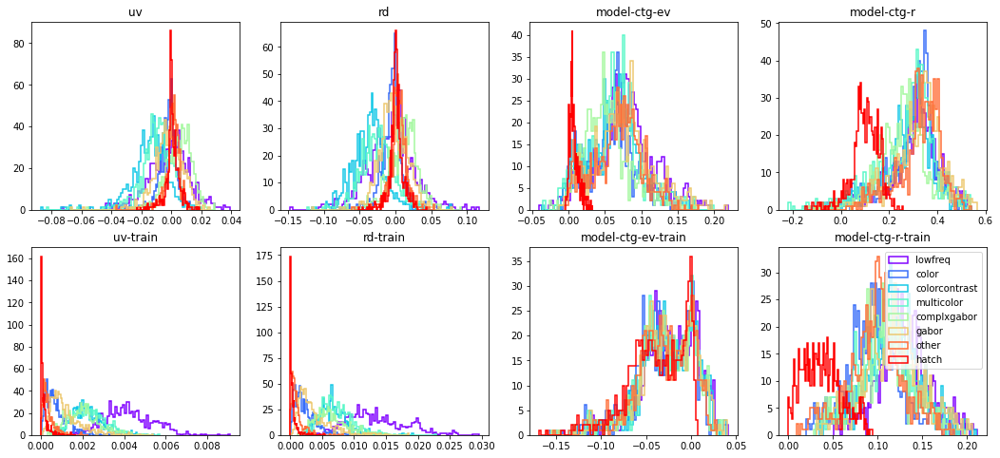

In [24]:
indexnames = ['uv', 'rd', 'model-ctg-ev', 'model-ctg-r', 'uv-train', 'rd-train', 'model-ctg-ev-train', 'model-ctg-r-train']
for sub in ['sub-01', 'sub-05']:
    print(sub)
    show_roi = np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[subs.index(sub), :]==1)[0]])
    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    cate_label_names = list(conv2_labels.keys())
    colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))#[np.array([0,4,2,5,3,1,6,7])]
    for idx, ax in enumerate(axes.flatten()):
        indexname = indexnames[idx]
        corr = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_{indexname}.npy'))[:, show_roi]

        for icate in range(corr.shape[0]):
            ax.hist(corr[icate], bins=80, histtype='step', color=colors[icate], label=cate_label_names[icate], lw=1.5, alpha=1)
        ax.set_title(indexname)
        # ax.set_xlim([-0.05, 0.05])
    plt.legend()
    plt.show()

##### show normalized performance (divide noise ceiling)

sub-01 416


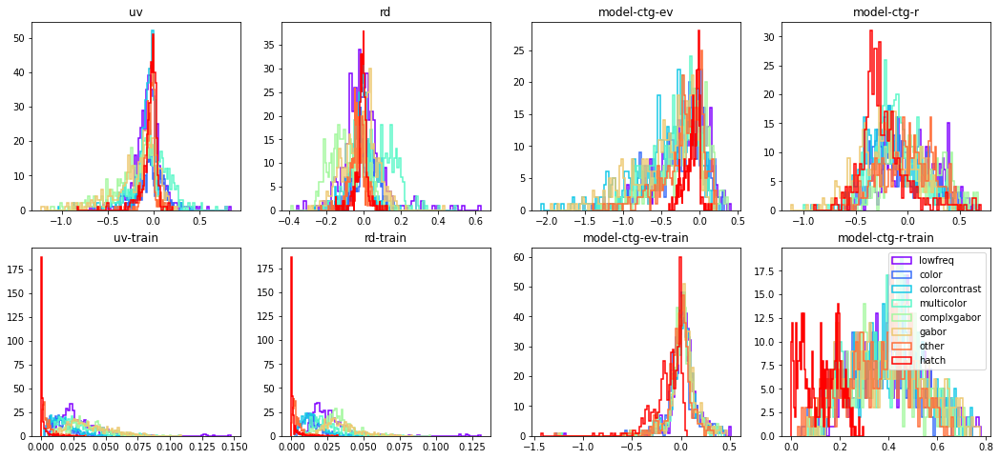

sub-02 542


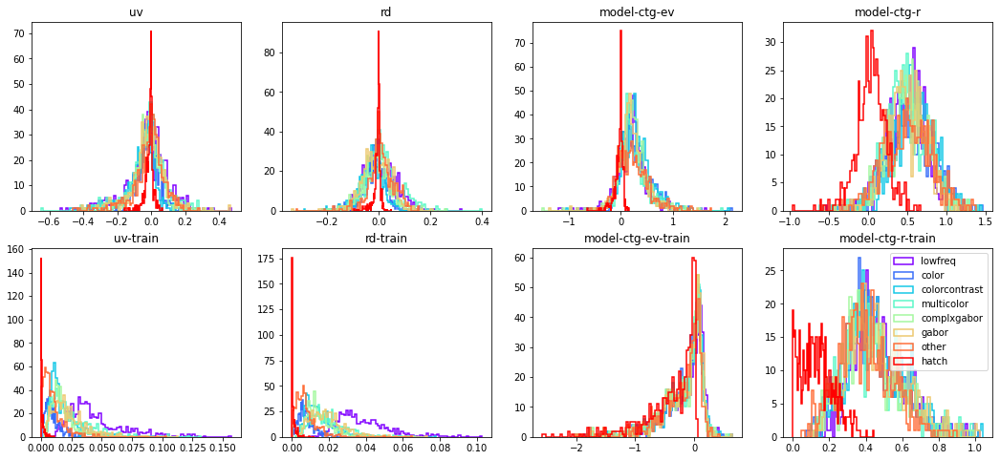

sub-03 681


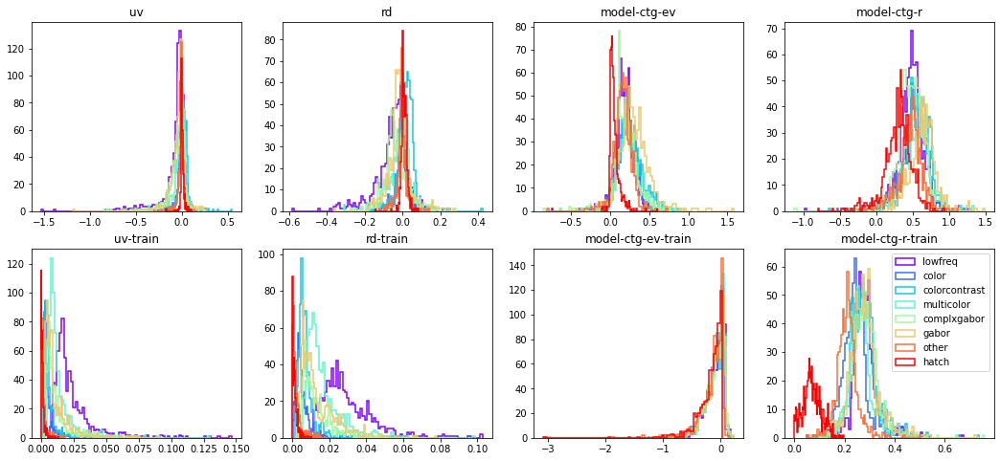

sub-04 695


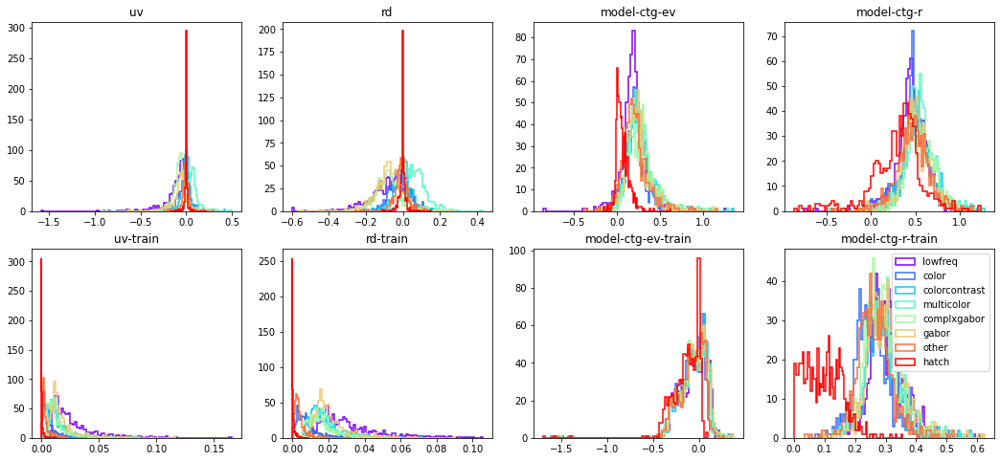

sub-05 636


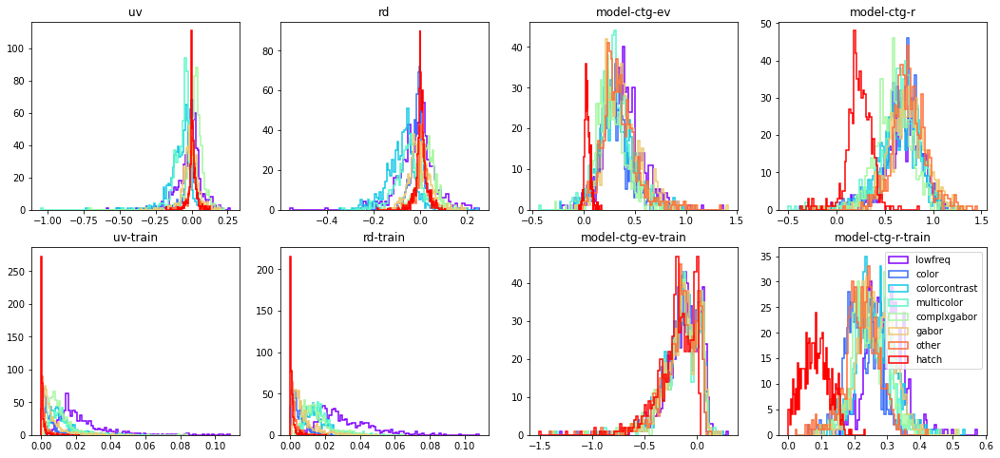

sub-06 601


KeyboardInterrupt: 

In [25]:
noise_ceilings = np.load(pjoin(wk_dir, 'anal/coco-nc/sub-all_noiseceiling.npy'))
indexnames = ['uv', 'rd', 'model-ctg-ev', 'model-ctg-r', 'uv-train', 'rd-train', 'model-ctg-ev-train', 'model-ctg-r-train']
for sub in subs:
    
    show_roi = np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[subs.index(sub), :]==1)[0]])
    valid_vertices = np.where(noise_ceilings[subs.index(sub), show_roi] > 0.05)[0]
    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    cate_label_names = list(conv2_labels.keys())
    colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))#[np.array([0,4,2,5,3,1,6,7])]
    print(sub, len(valid_vertices))
    for idx, ax in enumerate(axes.flatten()):
        indexname = indexnames[idx]
        corr = np.load(pjoin(corr_path, f'{sub}/{sub}_bm-{mask_name}_layer-{layername}_{indexname}.npy'))[:, show_roi][:, valid_vertices]
        if 'v' in indexname:
            corr = corr / (noise_ceilings[subs.index(sub), show_roi][valid_vertices])
        else:
            corr = corr / np.sqrt(noise_ceilings[subs.index(sub), show_roi][valid_vertices])
        for icate in range(corr.shape[0]):
            ax.hist(corr[icate], bins=80, histtype='step', color=colors[icate], label=cate_label_names[icate], lw=1.5, alpha=1)
        ax.set_title(indexname)
        # ax.set_xlim([-0.05, 0.05])
    plt.legend()
    plt.show()

##### shuffled performance 

sub-01


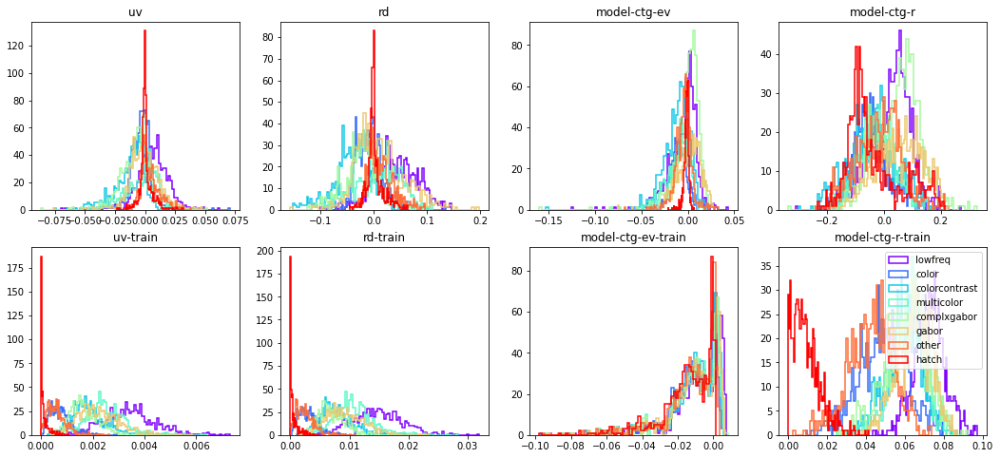

sub-05


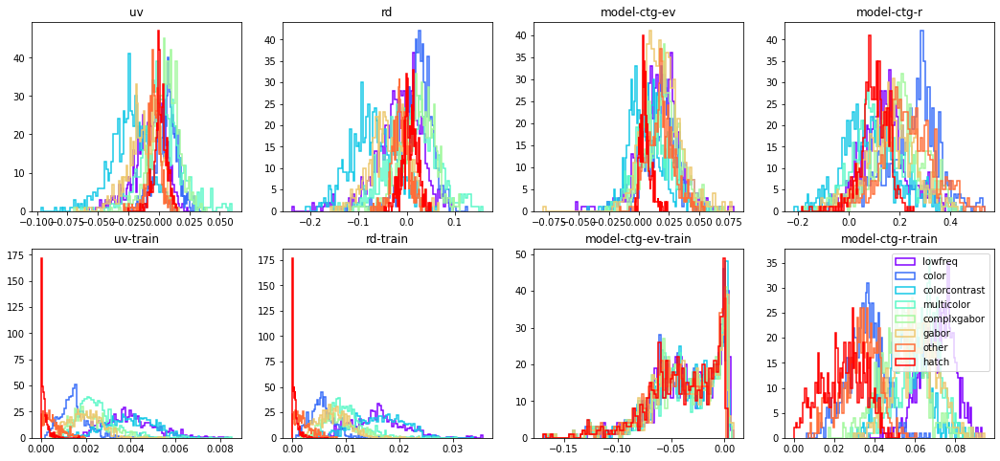

In [ ]:
indexnames = ['uv', 'rd', 'model-ctg-ev', 'model-ctg-r', 'uv-train', 'rd-train', 'model-ctg-ev-train', 'model-ctg-r-train']
for sub in ['sub-01', 'sub-05']:
    print(sub)
    show_roi = np.array([_ for _ in v1_voxels if _ in np.where(mask_fix[subs.index(sub), :]==1)[0]])
    fig, axes = plt.subplots(2, 4, figsize=(18, 8))
    cate_label_names = list(conv2_labels.keys())
    colors = plt.cm.rainbow(np.linspace(0, 1, len(cate_label_names)))#[np.array([0,4,2,5,3,1,6,7])]
    for idx, ax in enumerate(axes.flatten()):
        indexname = indexnames[idx]
        corr = np.load(pjoin(corr_path, f'shuffle/{sub}/{sub}_bm-{mask_name}_layer-{layername}_{indexname}.npy'))[:, show_roi]

        for icate in range(corr.shape[0]):
            ax.hist(corr[icate], bins=80, histtype='step', color=colors[icate], label=cate_label_names[icate], lw=1.5, alpha=1)
        ax.set_title(indexname)
        # ax.set_xlim([-0.05, 0.05])
    plt.legend()
    plt.show()

#### compute coco noise ceiling following:
Allen, E. J., St-Yves, G., Wu, Y., Breedlove, J. L., Prince, J. S., Dowdle, L. T., Nau, M., Caron, B., Pestilli, F., Charest, I., Hutchinson, J. B., Naselaris, T., & Kay, K. (2022). A massive 7T fMRI dataset to bridge cognitive neuroscience and artificial intelligence. Nature Neuroscience, 25(1), Article 1. https://doi.org/10.1038/s41593-021-00962-x


In [ ]:
wk_dir = '/nfs/z1/userhome/GongZhengXin/NVP/NaturalObject/data/code/nodretinotopy/mfm_locwise_fullpipeline'
test_set_name = 'coco'
resp_path = pjoin(wk_dir, 'prep/brain_response/')
nc_path =  pjoin(wk_dir, 'anal/coco-nc/')

noise_ceilings = np.nan*np.zeros((len(subs), 59412))
ncsnrs = np.nan*np.zeros((len(subs), 59412))
for i, sub in enumerate(subs):
    
    test_resp = np.load(pjoin(resp_path, f'{sub}_{test_set_name}_beta.npy'))
    test_resp = zscore(test_resp, axis=0)

    num_trial = test_resp.shape[0]
    num_run = int(num_trial/120)
    test_resp = test_resp.reshape((num_run, 120, 59412))

    var_noise = np.mean(np.var(test_resp, axis=0, ddof=1), axis=0)
    var_signal = np.maximum(1 - var_noise, 0)
    
    ncsnrs[i, :] = np.sqrt(var_signal/var_noise)
    noise_ceilings[i, :] = ncsnrs[i, :]**2/(ncsnrs[i, :]**2 + 1/num_run)

np.save(pjoin(nc_path, 'sub-all_noiseceiling.npy'), noise_ceilings)
np.save(pjoin(nc_path, 'sub-all_ncsnr.npy'), ncsnrs)

In [ ]:
noise_ceilings[i, :], ncsnrs[i, :]**2/(ncsnrs[i, :]**2 + 1/120)

(array([-0., -0., -0., ..., -0., -0., -0.]),
 array([0., 0., 0., ..., 0., 0., 0.]))